In [1]:
from capsnet.model import load_model

model, params = load_model("main")
model

CapsNet(
  (conv_layers): Sequential(
    (0): Conv2d(1, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(128, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (primary_capsules): PrimaryCapsules(
    (conv): Conv2d(256, 290, kernel_size=(4, 4), stride=(2, 2))
  )
  (digit_capsules): CapsuleLayer()
  (decoder): Sequential(
    (0): Linear(in_features=96, out_features=512, bias=True)
    (1): Dropout(p=0.35738198055304526, inplace=False)
    (2): ReLU()
    (3): Linear(in_features=512, out_features=1024, bias=True)
    (4): Dropout(p=0.42925866582391436, inplace=False)
    (5): ReLU(

In [2]:
import torch
from capsnet.dataset_helper import load_test_dataset

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = model.to(device)

test_dataset, test_loader = load_test_dataset(img_size=params["input_size"])

c:\Users\RINGULARITY\venvs\model_train\Lib\site-packages\albumentations\__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


100%|██████████| 72/72 [00:00<00:00, 465.88it/s]


              precision    recall  f1-score   support

     Crazing       1.00      1.00      1.00        12
   Inclusion       1.00      1.00      1.00        12
     Patches       1.00      1.00      1.00        12
      Pitted       1.00      1.00      1.00        12
      Rolled       1.00      1.00      1.00        12
   Scratches       1.00      1.00      1.00        12

    accuracy                           1.00        72
   macro avg       1.00      1.00      1.00        72
weighted avg       1.00      1.00      1.00        72



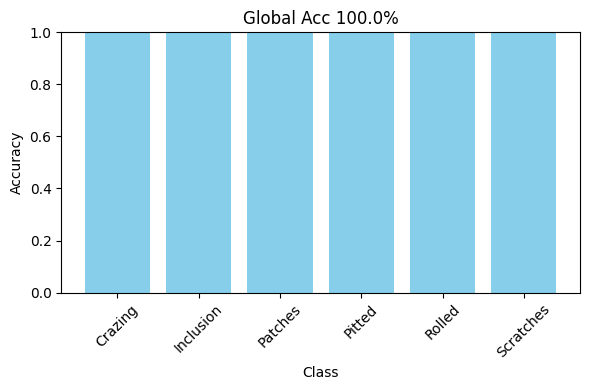

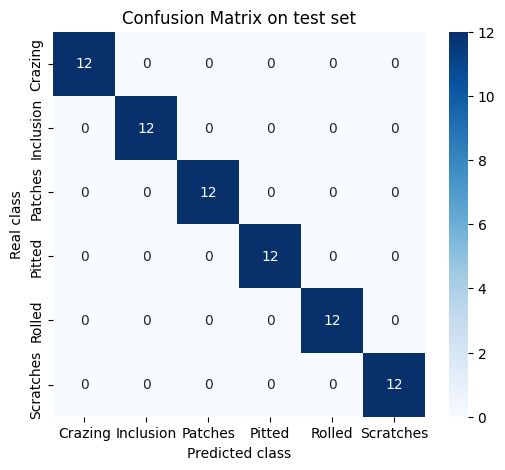

In [3]:
from capsnet.evaluation_helper import evaluate_model, visualize_model_performances

cm, global_accuracy, per_class_accuracy, classif_report = evaluate_model(model, test_loader, device, test_dataset.classes)
visualize_model_performances(cm, global_accuracy, per_class_accuracy, classif_report, test_dataset.classes)

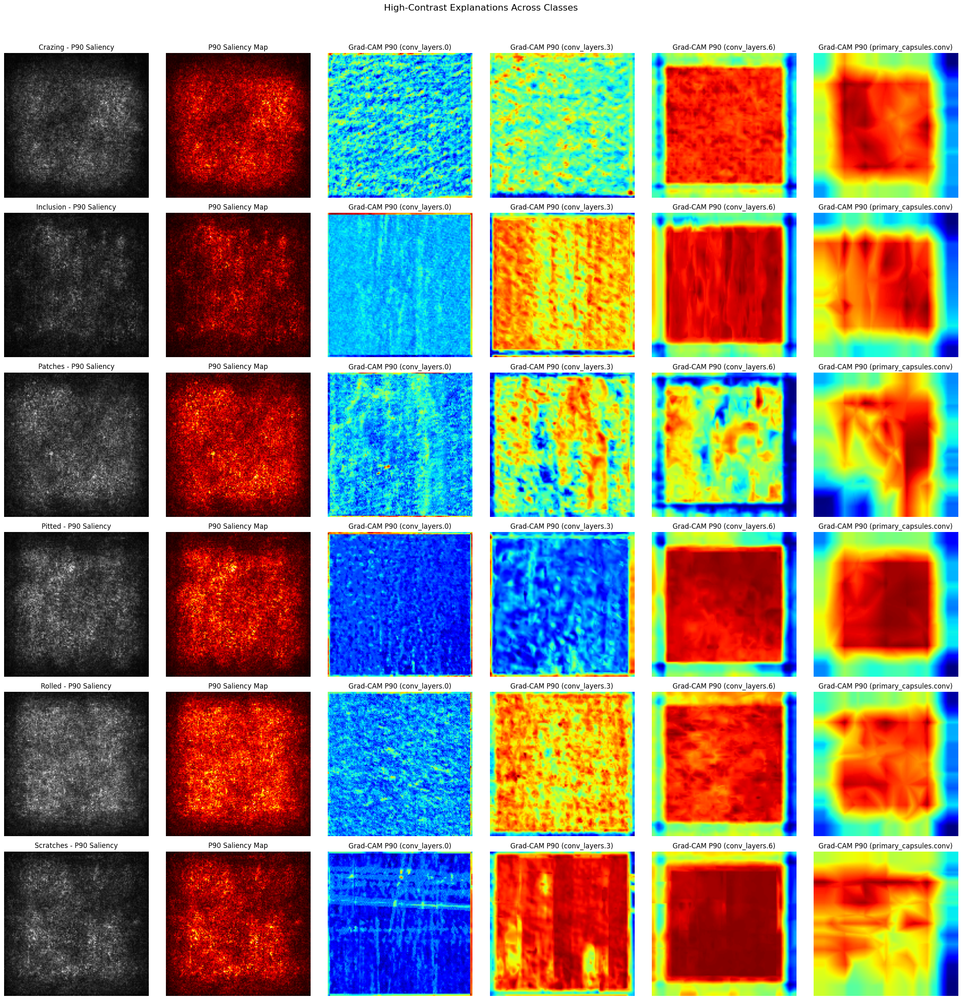

In [4]:
from capsnet.explicability_helper import visualize_high_contrast_explanations_for_all_classes

target_layer_names = ["conv_layers.0", "conv_layers.3", "conv_layers.6", "primary_capsules.conv"]

visualize_high_contrast_explanations_for_all_classes(model, test_dataset, device, target_layer_names)

In [5]:
import importlib
import capsnet.explicability_helper

importlib.reload(capsnet.explicability_helper)

<module 'capsnet.explicability_helper' from 'c:\\Users\\RINGULARITY\\Documents\\dev\\images_classification\\capsnet\\explicability_helper.py'>

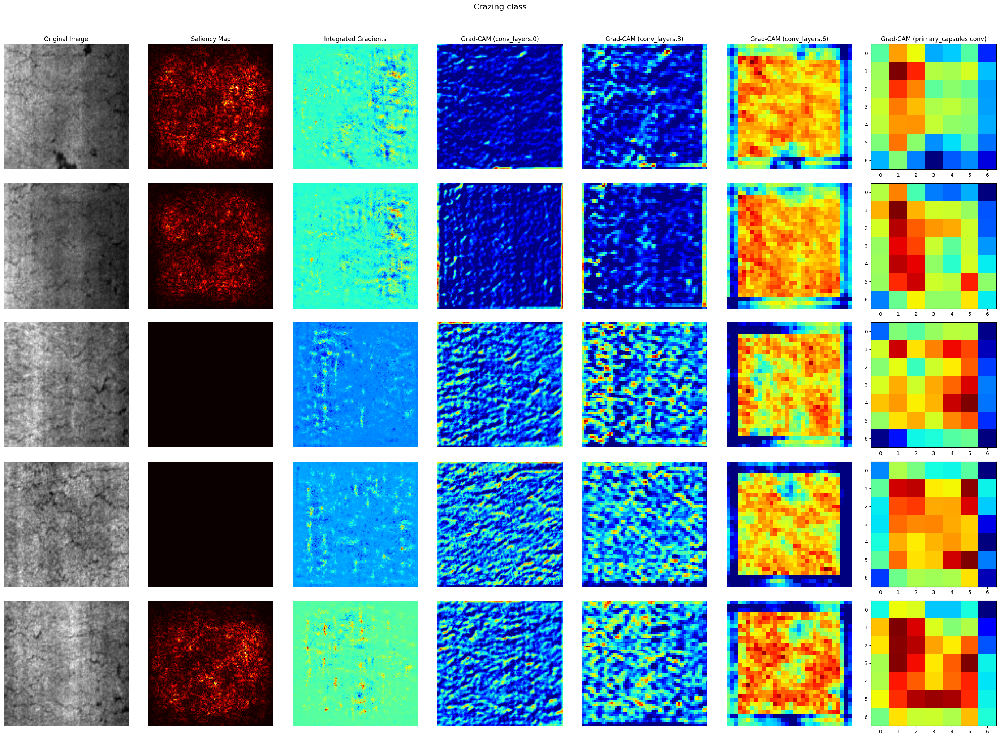

In [6]:
from capsnet.explicability_helper import visualize_explanations_for_specific_class

visualize_explanations_for_specific_class(
    model=model, 
    dataset=test_dataset, 
    device=device,
    target_layer_names=target_layer_names, 
    class_name="Crazing", 
    image_amount=5,
    seed=42
)

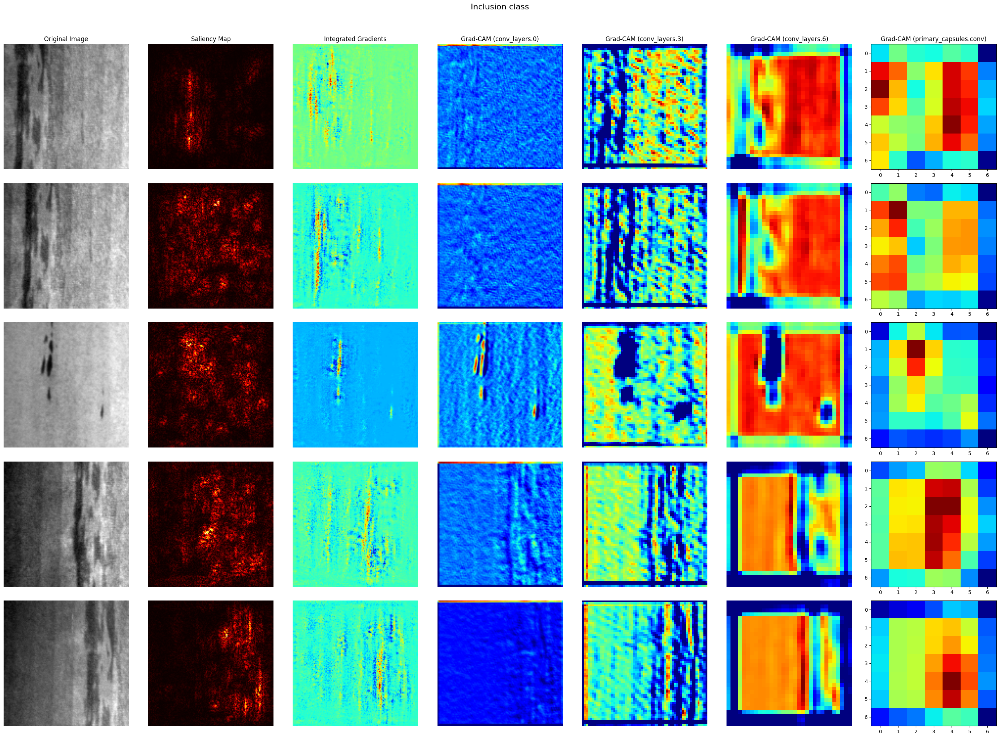

In [7]:
visualize_explanations_for_specific_class(
    model=model,
    dataset=test_dataset, 
    device=device,
    target_layer_names=target_layer_names, 
    class_name="Inclusion", 
    image_amount=5,
    seed=42
)